In [3]:
import re
import cv2
import numpy as np
#from google.colab.patches import cv2_imshow

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


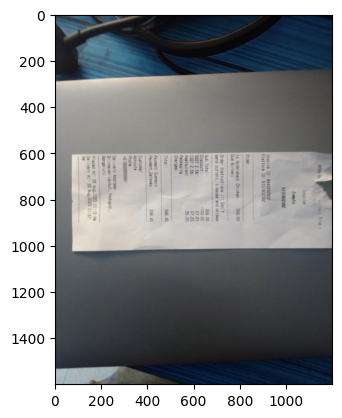

In [5]:
Query = cv2.imread("WhatsApp Image 2023-08-26 at 3.09.57 PM (2).jpeg")

# # Viewing the Query Image
#cv2_imshow(Query)


imgplot = plt.imshow(Query)
plt.show()

In [6]:
orb = cv2.ORB_create(5000) # Increase this number if all features are not being detected 
keypoints, descriptors = orb.detectAndCompute(Query, None)

Input Image: 



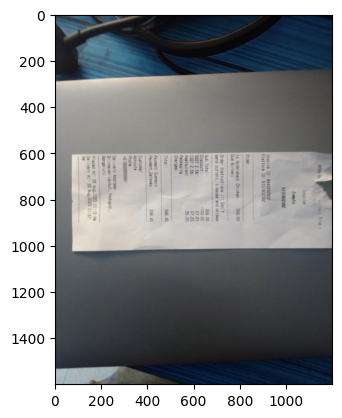


Input Image after being transformed: 



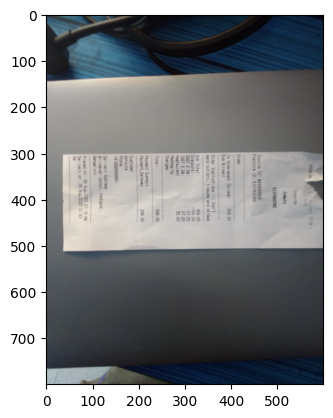

In [9]:
def resize(image):
    #imagepath = "/content/"
    #picture = input("Enter name of the image: ")
    #image = cv2.imread(imagepath + f"/{picture}")
    w, h, _ = image.shape
    
    dem = image.copy()
    dem = cv2.resize(dem,(650, 1000))
    print("Input Image: \n")
    #cv2_imshow(dem)
    imgplot = plt.imshow(image)
    plt.show()
    print()

    keypoints_2, descriptors_2 = orb.detectAndCompute(image, None)
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
    matches = matcher.match(descriptors_2, descriptors)
    matches = sorted(matches, key = lambda x:x.distance) 
    
    best_matches = matches[:int(len(matches) * 0.25)] # 25% of the best matches
    
    # # Visualizing the matches
    # pic_match = cv2.drawMatches(Query, keypoints, image, keypoints_2, best_matches[:30], None, flags = 2) 
    # pic_match = cv2.resize(pic_match, (w // 2, h // 2))
    # cv2_imshow(pic_match)

    source_points = np.float32([keypoints_2[i.queryIdx].pt for i in best_matches]).reshape(-1, 1, 2)
    destination_points = np.float32([keypoints[i.trainIdx].pt for i in best_matches]).reshape(-1, 1, 2)
    
    homography, _ = cv2.findHomography(source_points, destination_points, cv2.RANSAC, 5.0)
    scanned_image = cv2.warpPerspective(image, homography, (Query.shape[1], Query.shape[0]))

    scanned_copy = scanned_image.copy()
    scanned_mask = np.zeros_like(scanned_copy)
    demo = scanned_image.copy()
    demo = cv2.resize(demo,(Query.shape[1] // 2, Query.shape[0] // 2))
    print("Input Image after being transformed: \n")
    #cv2_imshow(demo)
    imgplot = plt.imshow(demo)
    plt.show()
    return scanned_copy, scanned_mask, scanned_image

copy, mask, ogimage = resize(Query)

In [13]:
from imutils.perspective import four_point_transform
import cv2
import numpy

# Load image, grayscale, Gaussian blur, Otsu's threshold
image = cv2.imread("WhatsApp Image 2023-08-26 at 3.09.57 PM (2).jpeg")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (7,7), 0)
thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

# Find contours and sort for largest contour
cnts = cv2.findContours(thresh, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
displayCnt = None

for c in cnts:
    # Perform contour approximation
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) == 4:
        displayCnt = approx
        break

# Obtain birds' eye view of image
warped = four_point_transform(image, displayCnt.reshape(4, 2))

cv2.imshow("thresh", thresh)
cv2.imshow("warped", warped)
cv2.imshow("image", image)
cv2.waitKey()

-1

In [12]:
#! pip install imutils

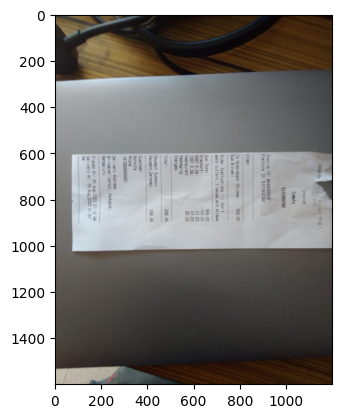

In [14]:
import cv2
import imutils
import matplotlib.pyplot as plt
from PIL import Image

raw_path = "WhatsApp Image 2023-08-26 at 3.09.57 PM (2).jpeg" # Enter the path to your scanned receipt
raw_img = cv2.imread(raw_path)

# View the image in RGB
raw_rgb = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)
plt.imshow(raw_rgb)
plt.show()

1200 1600


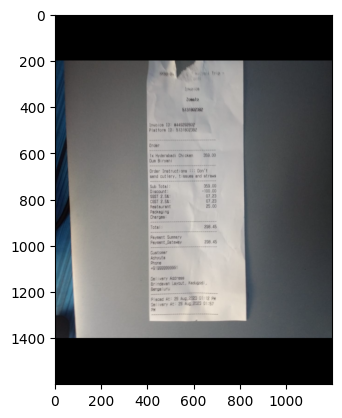

In [23]:
# before orientation, first crop object from image
def orient_vertical(img):
    width = img.shape[1]
    height = img.shape[0]
    print(width,height)
    if width < height:
        rotated = imutils.rotate(img, angle=-270)
    else:
        rotated = img
    return rotated

roated = orient_vertical(raw_img)
plt.imshow(roated)
plt.show()

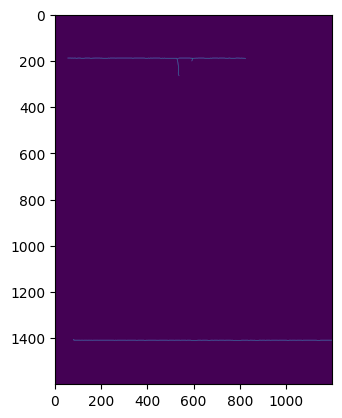

In [25]:
def sharpen_edge(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (15, 15), 0)
    rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (11, 11))
    dilated = cv2.dilate(blurred, rectKernel, iterations=2)
    edged = cv2.Canny(dilated, 75, 200, apertureSize=3)
    return edged

edged = sharpen_edge(roated)
plt.imshow(edged)
plt.show()

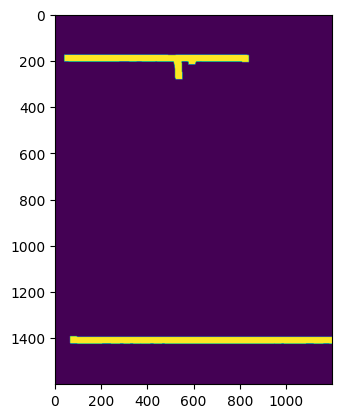

In [26]:
def binarize(img, threshold):
    threshold = np.mean(img)
    thresh, binary = cv2.threshold(img, threshold, 255, cv2.THRESH_BINARY)
    rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))
    dilated = cv2.dilate(binary, rectKernel, iterations=2)
    return dilated

threshold = 100
dilated = binarize(edged, threshold)
plt.imshow(dilated)
plt.show()

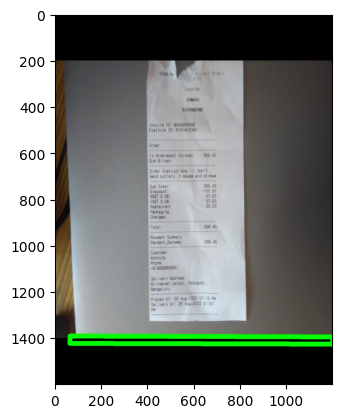

In [32]:
largest_cnt = None

def find_receipt_bounding_box(binary, img):
    global largest_cnt
    contours, hierarchy = cv2.findContours(
        binary, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
    largest_cnt = max(contours, key=cv2.contourArea)
    rect = cv2.minAreaRect(largest_cnt)
    box = np.intp(cv2.boxPoints(rect))
    boxed = cv2.drawContours(img.copy(), [box], 0, (0, 255, 0), 20)
    return rect, boxed

rect, boxed = find_receipt_bounding_box(dilated, roated)
boxed_rgb = cv2.cvtColor(boxed, cv2.COLOR_BGR2RGB)
plt.imshow(boxed_rgb)
plt.show()

Angle_0 =  0.2
Uniform angle =  0.2
359.84458689391613


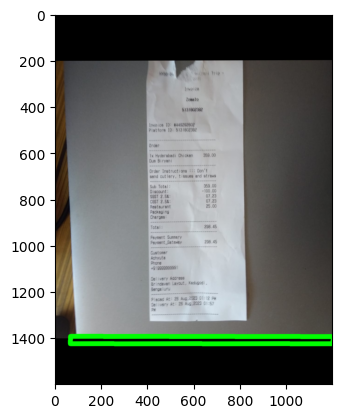

In [33]:
def find_tilt_angle(largest_contour):
    angle = rect[2]  # Find the angle of vertical line
    print("Angle_0 = ", round(angle, 1))

    if angle < -45:
        angle += 90
        print("Angle_1:", round(angle, 1))
    else:
        uniform_angle = abs(angle)
    print("Uniform angle = ", round(uniform_angle, 1))

    return rect, uniform_angle

rect, angle = find_tilt_angle(largest_cnt)

def adjust_tilt(img, angle):
    if angle >= 5 and angle < 80:
        rotated_angle = 0
    elif angle < 5:
        rotated_angle = angle
    else:
        rotated_angle = 270+angle

    tilt_adjusted = imutils.rotate(img, rotated_angle)
    delta = 360-rotated_angle
    return tilt_adjusted, delta


tilted, delta = adjust_tilt(boxed, angle)
print(delta)

tilted_rgb = cv2.cvtColor(tilted, cv2.COLOR_BGR2RGB)
plt.imshow(tilted_rgb, cmap='gray')
plt.show()

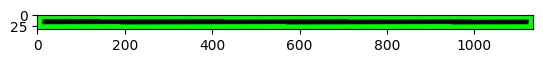

In [34]:
def crop(img, largest_contour):
    x, y, w, h = cv2.boundingRect(largest_contour)
    cropped = img[y:y+h, x:x+w]
    return cropped

cropped = crop(tilted, largest_cnt)
plt.imshow(cropped)
plt.show()

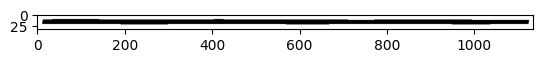

In [35]:
def enhance_txt(img):
    w = img.shape[1]
    h = img.shape[0]
    w1 = int(w*0.05)
    w2 = int(w*0.95)
    h1 = int(h*0.05)
    h2 = int(h*0.95)
    ROI = img[h1:h2, w1:w2]  # 95% of center of the image
    threshold = np.mean(ROI) * 0.98  # % of average brightness

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (1, 1), 0)
    edged = 255 - cv2.Canny(blurred, 100, 150, apertureSize=7)

    thresh, binary = cv2.threshold(blurred, threshold, 255, cv2.THRESH_BINARY)
    return binary

enhanced = enhance_txt(cropped)
enhanced_rgb = cv2.cvtColor(enhanced, cv2.COLOR_BGR2RGB)
#plt.imsave('enhanced.jpg', enhanced_rgb)
plt.imshow(enhanced_rgb)
plt.show()

In [36]:
def opencv_resize(image, ratio):
    width = int(image.shape[1] * ratio)
    height = int(image.shape[0] * ratio)
    dim = (width, height)
    return cv2.resize(image, dim, interpolation = cv2.INTER_AREA)

def plot_rgb(image):
    plt.figure(figsize=(16,10))
    return plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

def plot_gray(image):
    plt.figure(figsize=(16,10))
    return plt.imshow(image, cmap='Greys_r')

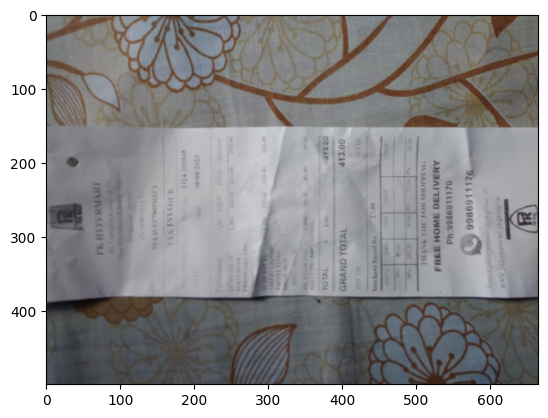

In [65]:
raw_path = "WhatsApp Image 2023-08-26 at 3.09.53 PM (1).jpeg"
image = cv2.imread(raw_path)
# Downscale image as finding receipt contour is more efficient on a small image
resize_ratio = 500 / image.shape[0]
original = image.copy()
image = opencv_resize(image, resize_ratio)
plt.imshow(image)
plt.show()

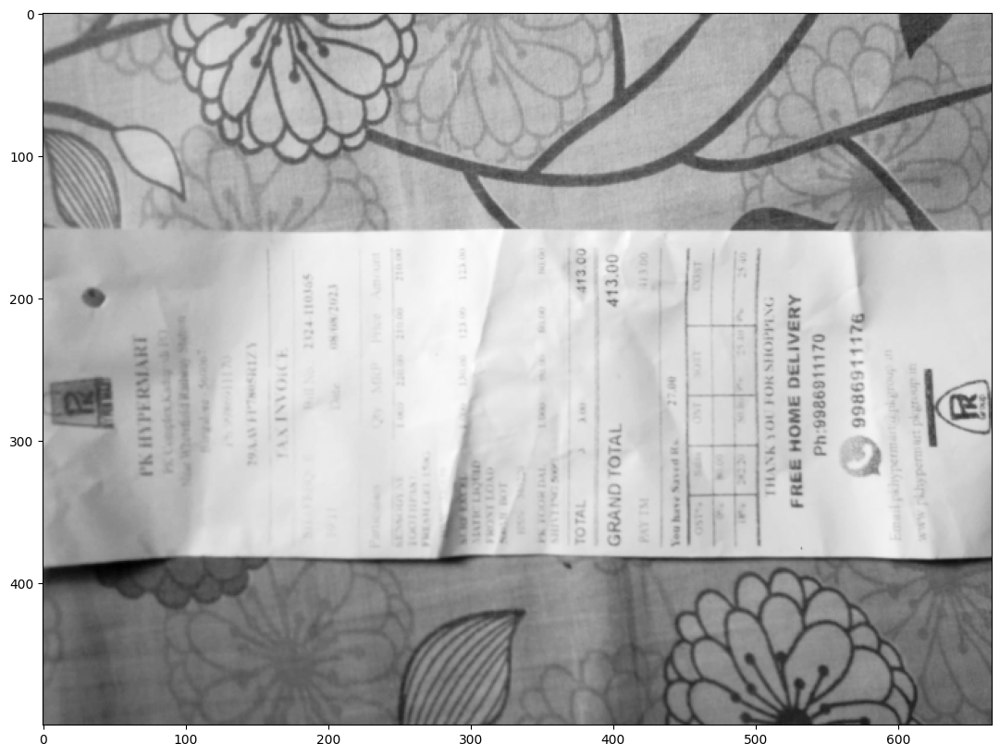

In [66]:
# Convert to grayscale for further processing
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plot_gray(gray)

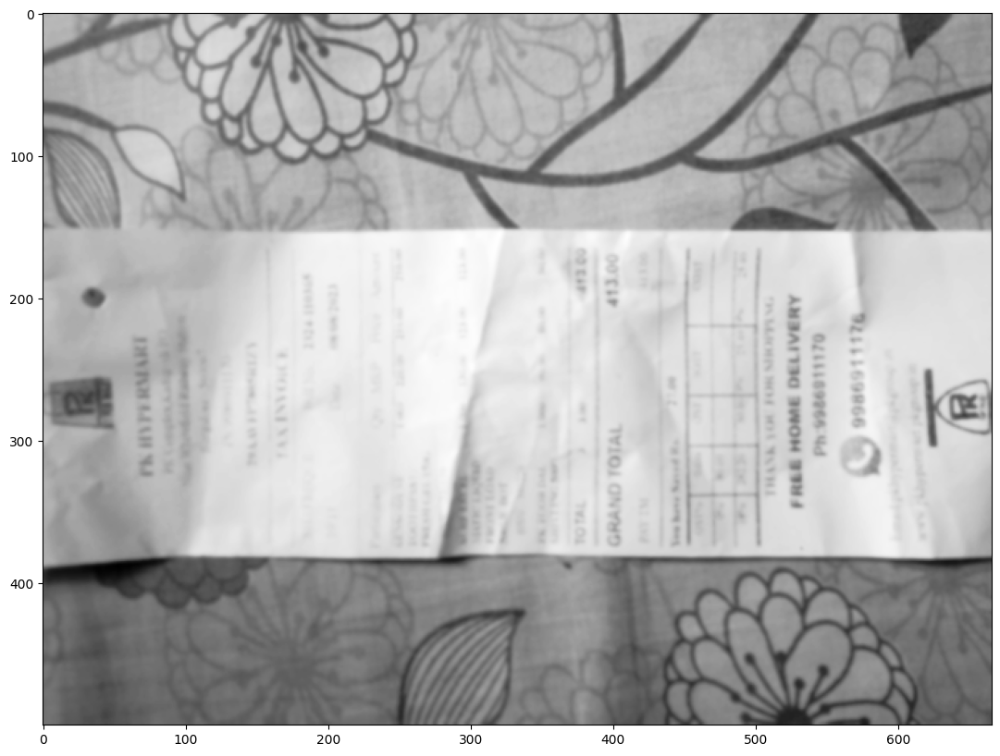

In [67]:
# Get rid of noise with Gaussian Blur filter
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
plot_gray(blurred)

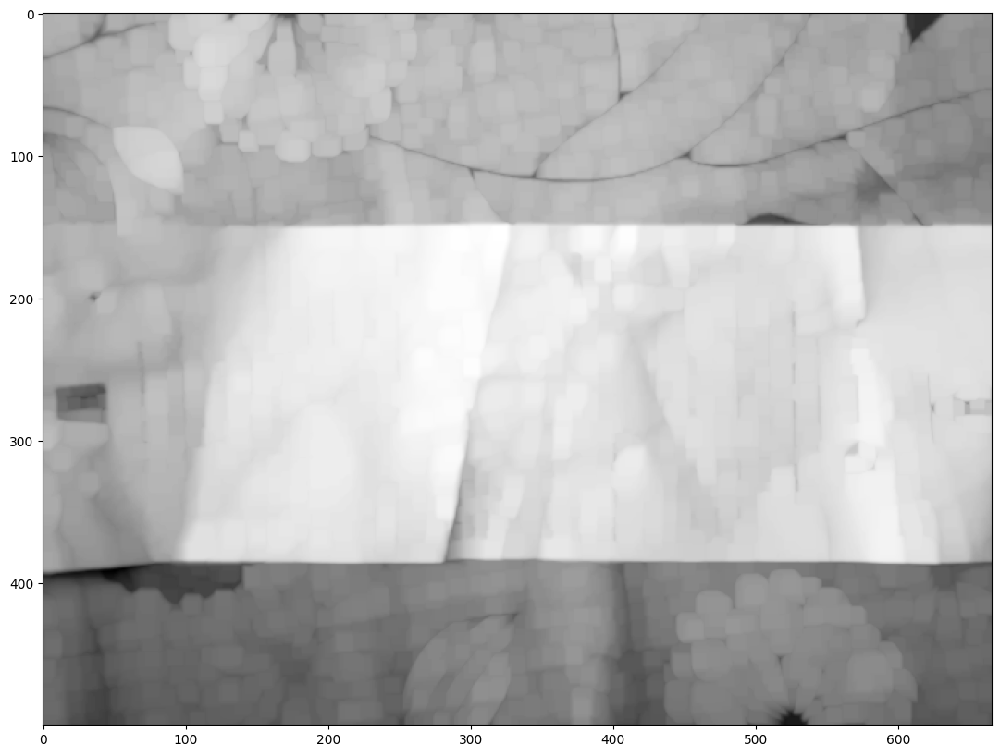

In [68]:
# Detect white regions
rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 9))
dilated = cv2.dilate(blurred, rectKernel)
plot_gray(dilated)

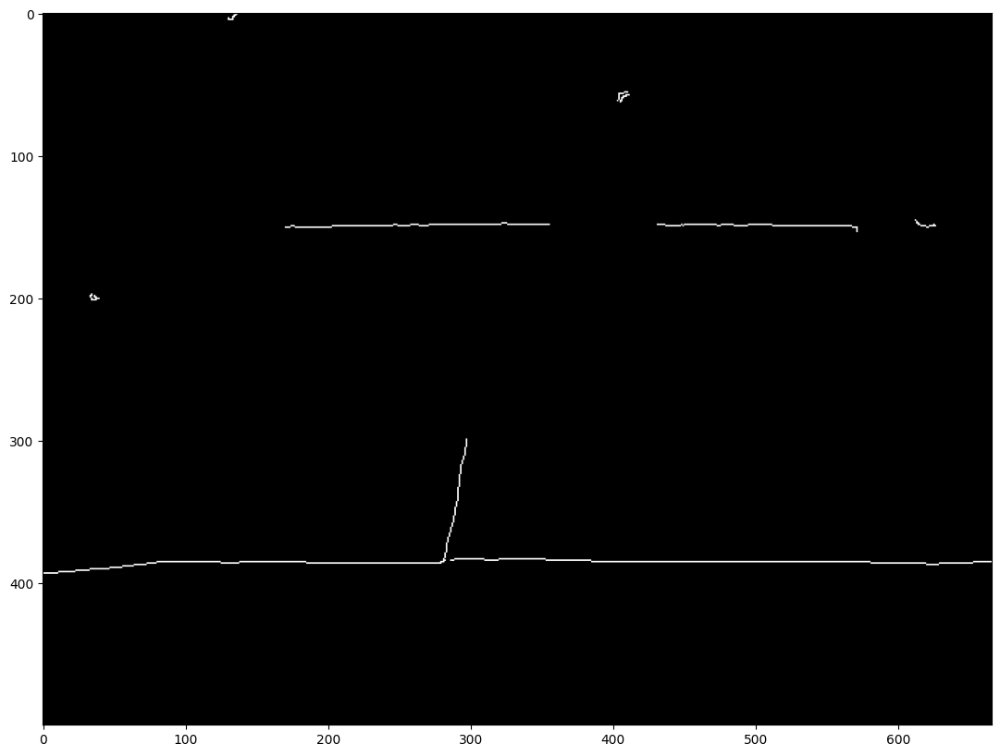

In [69]:
edged = cv2.Canny(dilated, 100, 200, apertureSize=3)
plot_gray(edged)

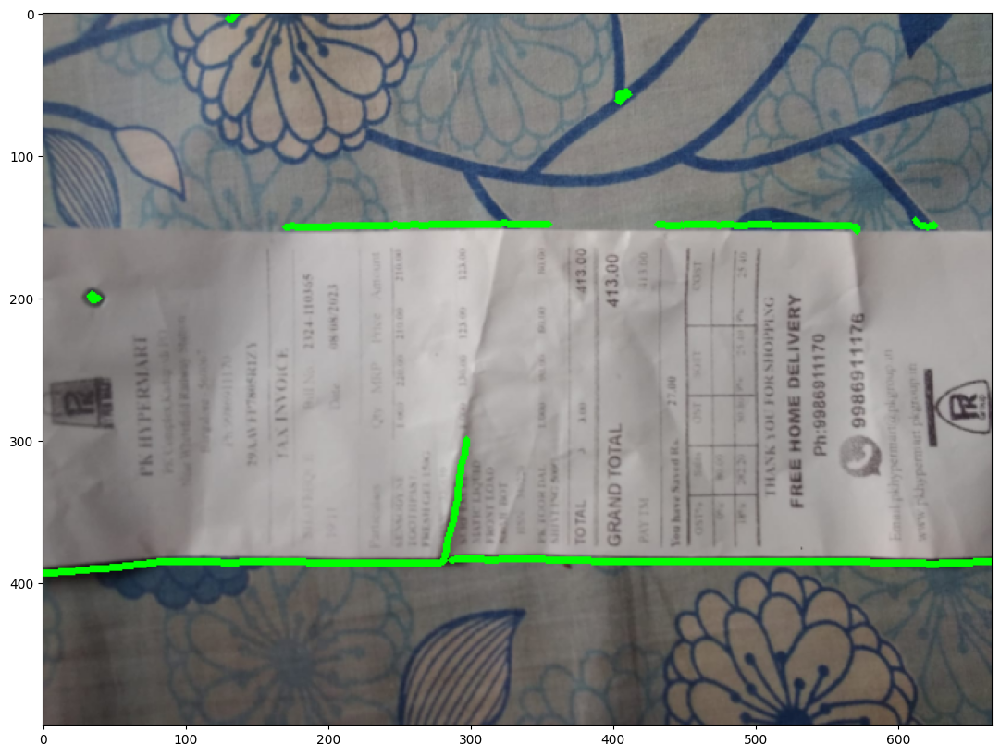

In [70]:
# Detect all contours in Canny-edged image
contours, hierarchy = cv2.findContours(edged, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
image_with_contours = cv2.drawContours(image.copy(), contours, -1, (0,255,0), 3)
plot_rgb(image_with_contours)

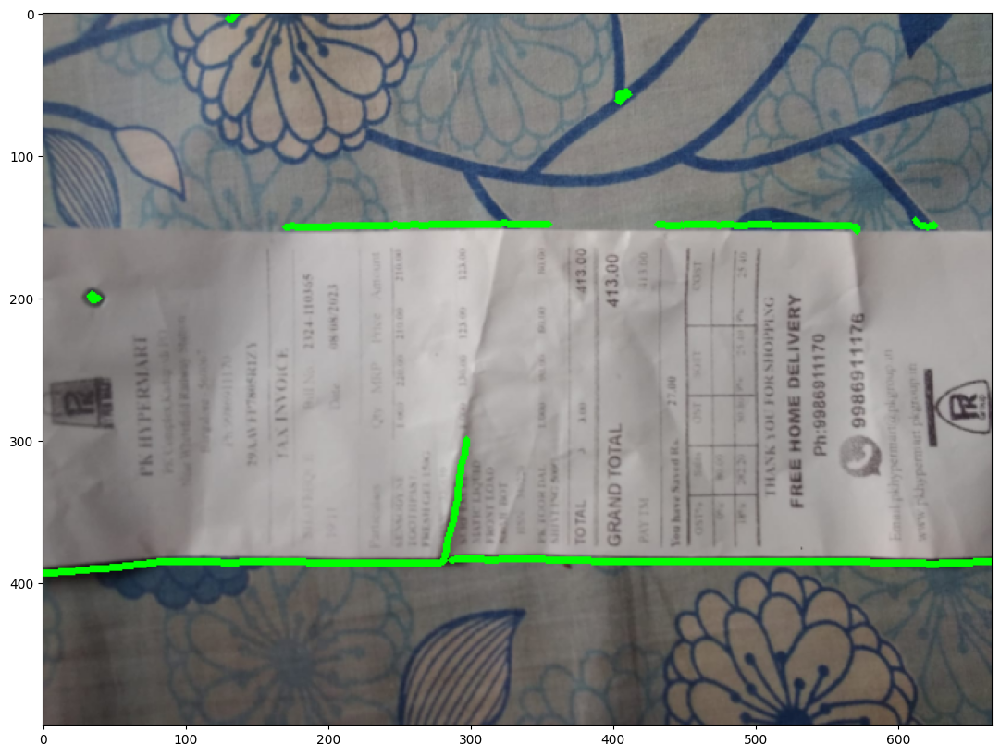

In [71]:
# Get 10 largest contours
largest_contours = sorted(contours, key = cv2.contourArea, reverse = True)[:10]
image_with_largest_contours = cv2.drawContours(image.copy(), largest_contours, -1, (0,255,0), 3)
plot_rgb(image_with_largest_contours)

In [72]:
# approximate the contour by a more primitive polygon shape
def approximate_contour(contour):
    peri = cv2.arcLength(contour, True)
    return cv2.approxPolyDP(contour, 0.032 * peri, True)

In [73]:
def get_receipt_contour(contours):    
    # loop over the contours
    for c in contours:
        approx = approximate_contour(c)
        print(approx)
        # if our approximated contour has four points, we can assume it is receipt's rectangle
        if len(approx) == 4:
            return approx

In [74]:
get_receipt_contour(largest_contours)

[[[ 33 198]]

 [[ 34 201]]

 [[ 39 200]]

 [[ 36 198]]

 [[ 37 200]]

 [[ 35 201]]

 [[ 33 199]]

 [[ 34 197]]]
[[[410  55]]

 [[404  56]]

 [[403  61]]

 [[405  62]]

 [[411  57]]

 [[405  61]]

 [[405  56]]]
[[[136   0]]

 [[135   0]]

 [[132   4]]

 [[130   3]]

 [[130   4]]

 [[133   4]]

 [[133   3]]]
[[[297 299]]

 [[278 386]]

 [[  0 393]]

 [[279 386]]]


array([[[297, 299]],

       [[278, 386]],

       [[  0, 393]],

       [[279, 386]]], dtype=int32)

[[[ 33 198]]

 [[ 34 201]]

 [[ 39 200]]

 [[ 36 198]]

 [[ 37 200]]

 [[ 35 201]]

 [[ 33 199]]

 [[ 34 197]]]
[[[410  55]]

 [[404  56]]

 [[403  61]]

 [[405  62]]

 [[411  57]]

 [[405  61]]

 [[405  56]]]
[[[136   0]]

 [[135   0]]

 [[132   4]]

 [[130   3]]

 [[130   4]]

 [[133   4]]

 [[133   3]]]
[[[297 299]]

 [[278 386]]

 [[  0 393]]

 [[279 386]]]


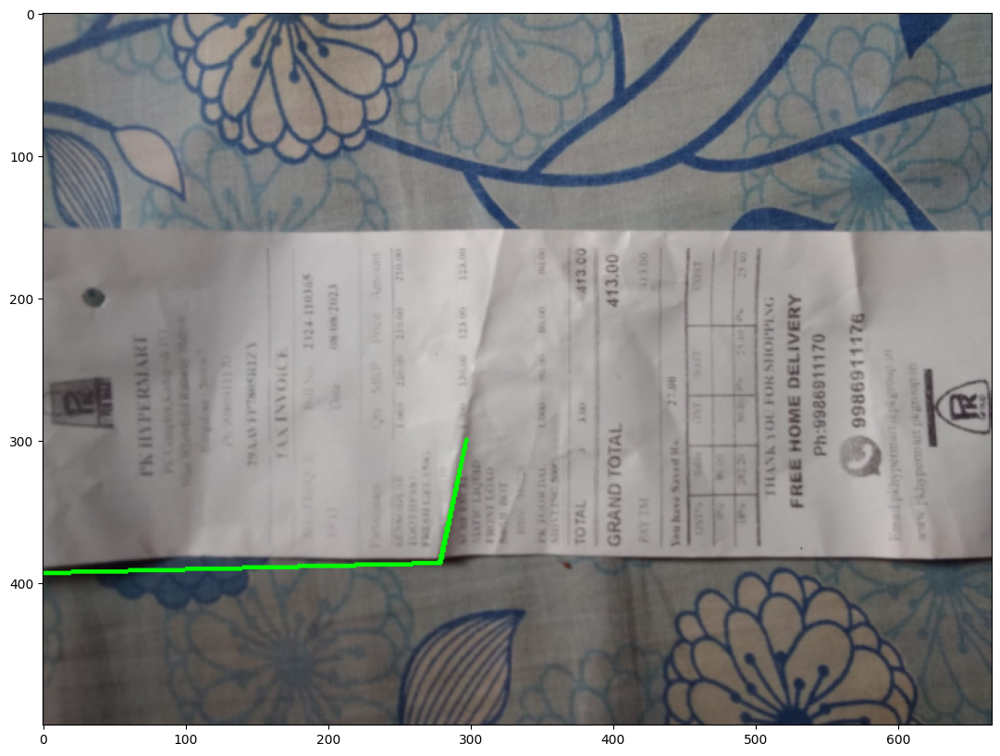

In [75]:
receipt_contour = get_receipt_contour(largest_contours)
image_with_receipt_contour = cv2.drawContours(image.copy(), [receipt_contour], -1, (0, 255, 0), 2)
plot_rgb(image_with_receipt_contour)

In [77]:
def contour_to_rect(contour):
    pts = contour.reshape(4, 2)
    rect = np.zeros((4, 2), dtype = "float32")
    # top-left point has the smallest sum
    # bottom-right has the largest sum
    s = pts.sum(axis = 1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    # compute the difference between the points:
    # the top-right will have the minumum difference 
    # the bottom-left will have the maximum difference
    diff = np.diff(pts, axis = 1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    return rect / resize_ratio

def wrap_perspective(img, rect):
    # unpack rectangle points: top left, top right, bottom right, bottom left
    (tl, tr, br, bl) = rect
    # compute the width of the new image
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    # compute the height of the new image
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    # take the maximum of the width and height values to reach
    # our final dimensions
    maxWidth = max(int(widthA), int(widthB))
    maxHeight = max(int(heightA), int(heightB))
    # destination points which will be used to map the screen to a "scanned" view
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype = "float32")
    # calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(rect, dst)
    # warp the perspective to grab the screen
    return cv2.warpPerspective(img, M, (maxWidth, maxHeight))

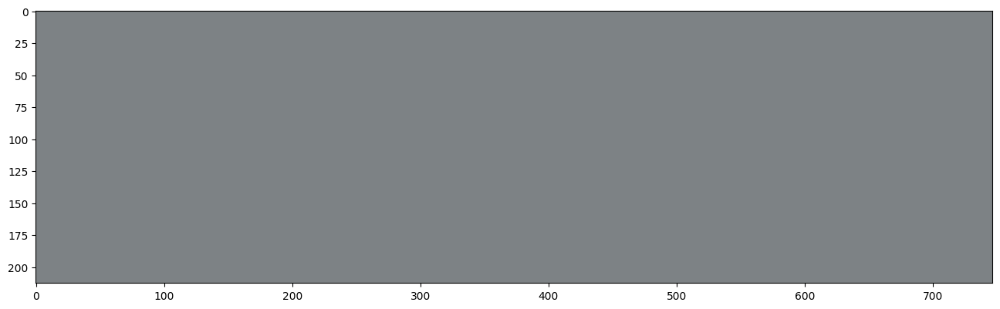

In [78]:
scanned = wrap_perspective(original.copy(), contour_to_rect(receipt_contour))
plt.figure(figsize=(16,10))
plt.imshow(scanned)

In [87]:
from skimage.filters import threshold_local
#from PIL import Image

def bw_scanner(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    T = threshold_local(gray, 21, offset = 5, method = "gaussian")
    return (gray > T).astype("uint8") * 255

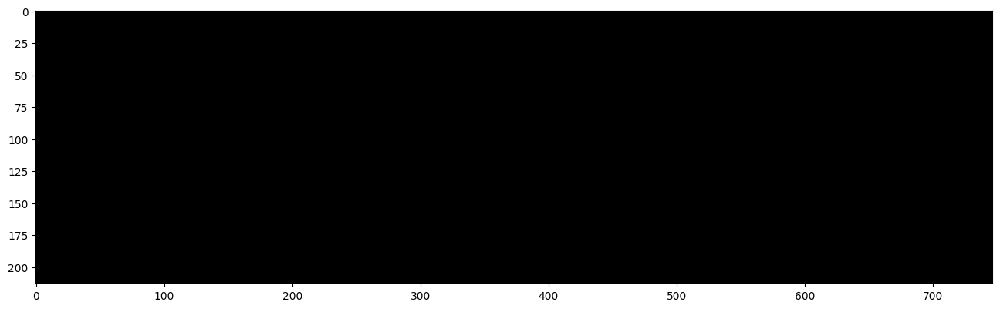

In [88]:
result = bw_scanner(scanned)
plot_gray(result)

In [86]:
#! pip install -U scikit-image

In [ ]:
output = Image.fromarray(result)
output.save('result.png')

In [89]:
img = cv2.imread(raw_path)
# Downscale image as finding receipt contour is more efficient on a small image
#resize_ratio = 500 / image.shape[0]
#img = raw_path

In [93]:
#binarisation
res = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)                   
plt.figure(figsize=(100, 60))
plt.imshow(res,'gray')
plt.show()

#noise filtering
cv2.fastNlMeansDenoisingColored(img,None,10,10,7,21) 

#skew correction
import numpy as np
from skimage import io
from skimage.transform import rotate
from skimage.color import rgb2gray
from deskew import determine_skew
image = io.imread(_img)
grayscale = rgb2gray(image)
angle = determine_skew(grayscale)                    
rotated = rotate(image, angle, resize=True) * 255
rotated=rotated.astype(np.uint8)

error: OpenCV(4.8.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\thresh.cpp:1674: error: (-215:Assertion failed) src.type() == CV_8UC1 in function 'cv::adaptiveThreshold'


In [94]:
!pip install smartcrop

                                              0.0/723.4 kB ? eta -:--:--
     -                                       30.7/723.4 kB 1.4 MB/s eta 0:00:01
     ---                                   61.4/723.4 kB 656.4 kB/s eta 0:00:02
     -------                                143.4/723.4 kB 1.4 MB/s eta 0:00:01
     -----------                            225.3/723.4 kB 1.4 MB/s eta 0:00:01
     ------------------                     358.4/723.4 kB 1.6 MB/s eta 0:00:01
     --------------------                   389.1/723.4 kB 1.3 MB/s eta 0:00:01
     -------------------------              481.3/723.4 kB 1.4 MB/s eta 0:00:01
     ------------------------------------   686.1/723.4 kB 1.8 MB/s eta 0:00:01
     -------------------------------------  716.8/723.4 kB 1.8 MB/s eta 0:00:01
     -------------------------------------  716.8/723.4 kB 1.8 MB/s eta 0:00:01
     -------------------------------------  716.8/723.4 kB 1.8 MB/s eta 0:00:01
     -------------------------------------- 723

  error: subprocess-exited-with-error
  
  exit code: 1
  
  [41 lines of output]
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-cpython-311
  creating build\lib.win-amd64-cpython-311\pygtkcompat
  copying pygtkcompat\generictreemodel.py -> build\lib.win-amd64-cpython-311\pygtkcompat
  copying pygtkcompat\pygtkcompat.py -> build\lib.win-amd64-cpython-311\pygtkcompat
  copying pygtkcompat\__init__.py -> build\lib.win-amd64-cpython-311\pygtkcompat
  creating build\lib.win-amd64-cpython-311\gi
  copying gi\docstring.py -> build\lib.win-amd64-cpython-311\gi
  copying gi\importer.py -> build\lib.win-amd64-cpython-311\gi
  copying gi\module.py -> build\lib.win-amd64-cpython-311\gi
  copying gi\pygtkcompat.py -> build\lib.win-amd64-cpython-311\gi
  copying gi\types.py -> build\lib.win-amd64-cpython-311\gi
  copying gi\_constants.py -> build\lib.win-amd64-cpython-311\gi
  copying gi\_error.py -> build\lib.win-amd64-cpython-311\gi
  copy

# segment using yolov8

In [96]:
#! pip install ultralytics

In [97]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolov8n.yaml")  # build a new model from scratch
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)

# Use the model
#model.train(data="coco128.yaml", epochs=3)  # train the model
#metrics = model.val()  # evaluate model performance on the validation set
#results = model(raw_path)  # predict on an image
#path = model.export(format="onnx")  # export the model to ONNX format
#results


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

ConnectionError:   Download failure for https://ultralytics.com/images/bus.jpg. Retry limit reached.

In [100]:
results = model(raw_path)


image 1/1 E:\IDP\WhatsApp Image 2023-08-26 at 3.09.53 PM (1).jpeg: 480x640 1 book, 249.9ms
Speed: 60.5ms preprocess, 249.9ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 640)


In [136]:
box_voc = list(results[0].boxes.xywh.numpy().squeeze())
box_voc

[389.894, 649.9348, 779.788, 566.4224]

In [143]:
x,y,w,h = box_voc
plt.Rectangle((x, y), w, h)
plt.show()

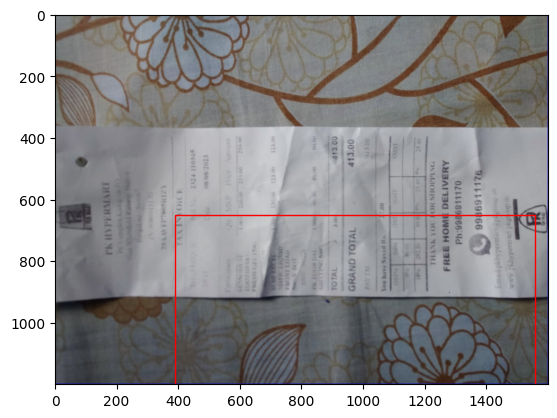

In [145]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

#im = Image.open('stinkbug.png')

# Create figure and axes
fig, ax = plt.subplots()

# Display the image
ax.imshow(img)

# Create a Rectangle patch
rect = patches.Rectangle((x, y), x+w, h+y, linewidth=1, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)

plt.show()

In [137]:
pbx.convert_bbox(box_voc, from_type="yolo", to_type="voc", image_size=(W, H))

ValueError: Given width and height must be in the range (0,1].

In [138]:
#dir(result[0])

#cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

import pybboxes as pbx

yolo_normalized = box_voc#(0.048765432089567184, 0.6583333611488342, 0.09753086417913437, 0.29814815521240234) 

H, W = img.shape[:2]

box_voc = pbx.convert_bbox(yolo_normalized, from_type="yolo", to_type="voc", image_size=(W,H))

print(box_voc)

# [Out]: (0, 153, 29, 242)

## for plotting:
cv2.rectangle(img, (box_voc[0], box_voc[1]), (box_voc[2], box_voc[3]), (0, 0, 255), 1)

ValueError: Given width and height must be in the range (0,1].

In [139]:
#! pip install pybboxes

In [140]:
H,W

(1200, 1600)

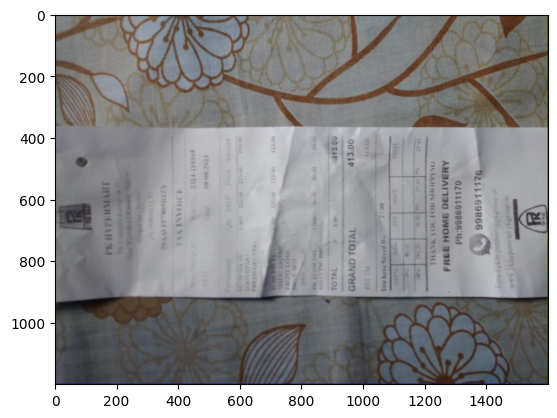

In [141]:
#import cv2
#import matplotlib.pyplot as plt

#img = cv2.imread(<image_path>)
#dh, dw, _ = img.shape
dh,dw = H,W

#fl = open(<label_path>, 'r')
#data = fl.readlines()
#fl.close()

#for dt in data:

# Split string to float
#_, x, y, w, h = map(float, dt.split(' '))
x, y, w, h = box_voc[0], box_voc[1], box_voc[2], box_voc[3]

# Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
# via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
l = int((x - w / 2) * dw)
r = int((x + w / 2) * dw)
t = int((y - h / 2) * dh)
b = int((y + h / 2) * dh)

#if l < 0:
#    l = 0
#if r > dw - 1:
#    r = dw - 1
#if t < 0:
#    t = 0
#if b > dh - 1:
#    b = dh - 1

cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)

In [146]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from skimage import data
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb
from skimage.color import rgb2gray
from matplotlib.pyplot import imshow
import cv2
from skimage import io

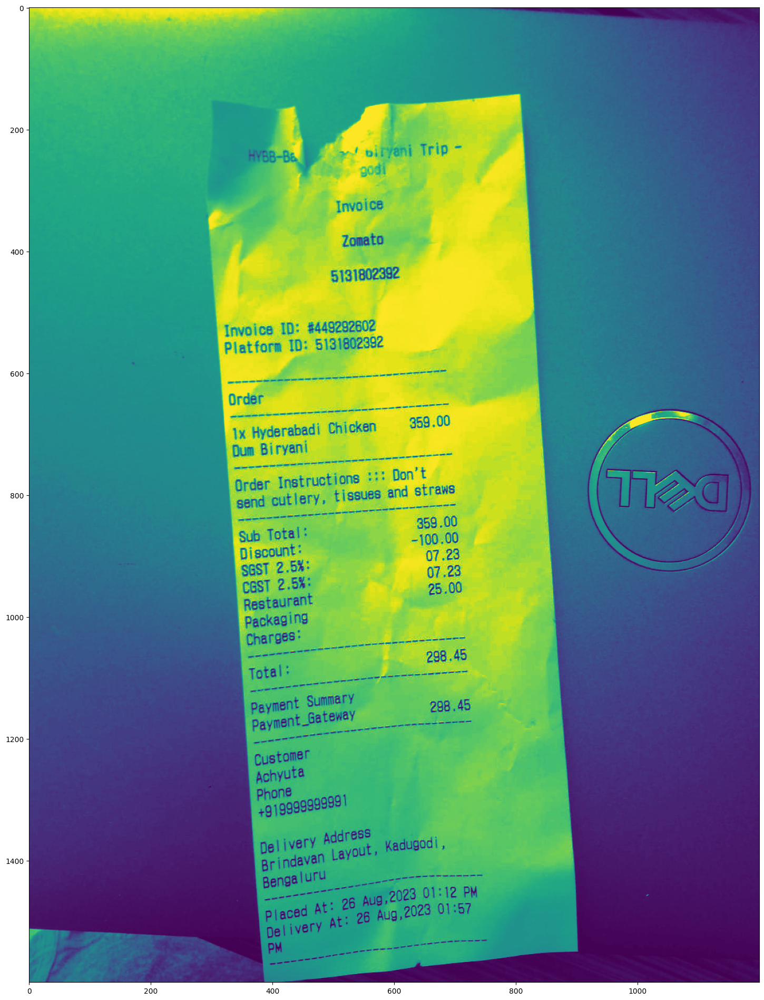

In [204]:
raw_path = "WhatsApp Image 2023-08-26 at 3.09.59 PM.jpeg"
#raw_path = "WhatsApp Image 2023-08-26 at 3.09.53 PM.jpeg"

img = cv2.imread(raw_path)
imgarea = img.shape[0]*img.shape[1]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
eq_grayscale_image = cv2.equalizeHist(gray)
fig, ax = plt.subplots(figsize=(40, 24))
ax.imshow(eq_grayscale_image)
#ax.add_patch(rect)
#ax.set_axis_off()
#plt.tight_layout()
plt.show()

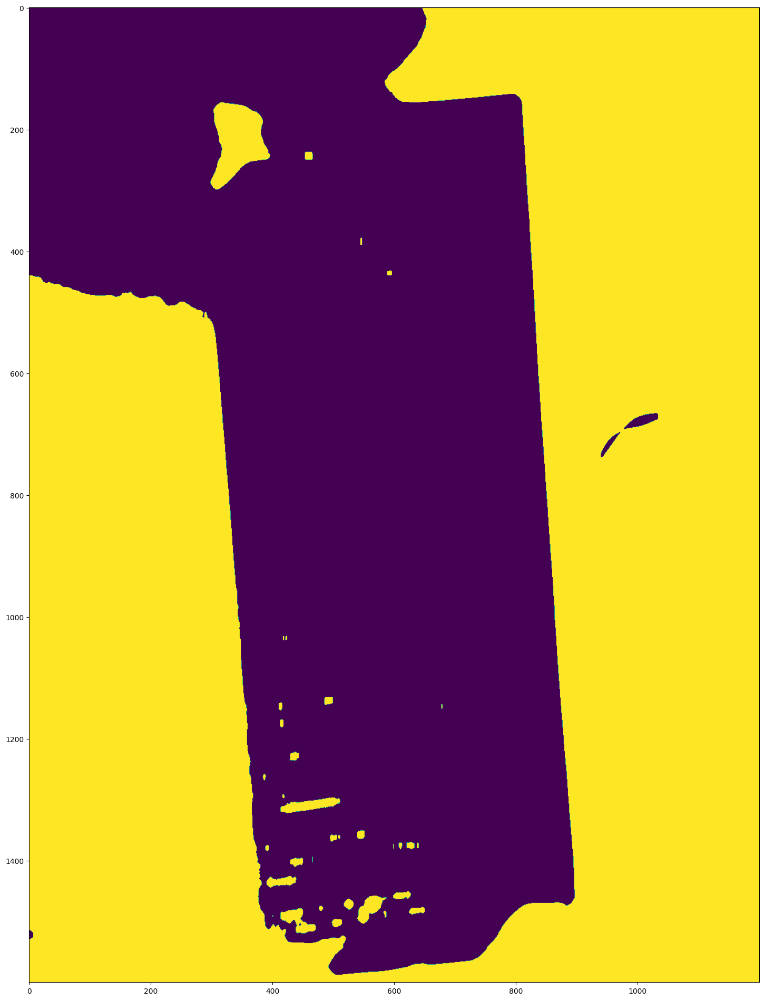

In [213]:
blur = cv2.GaussianBlur(eq_grayscale_image,(5,5),0)
ret,thresh = cv2.threshold(blur,140,195,cv2.THRESH_BINARY_INV)
median = cv2.medianBlur(thresh,25)
fig, ax = plt.subplots(figsize=(40, 24))
ax.imshow(median)
plt.show()

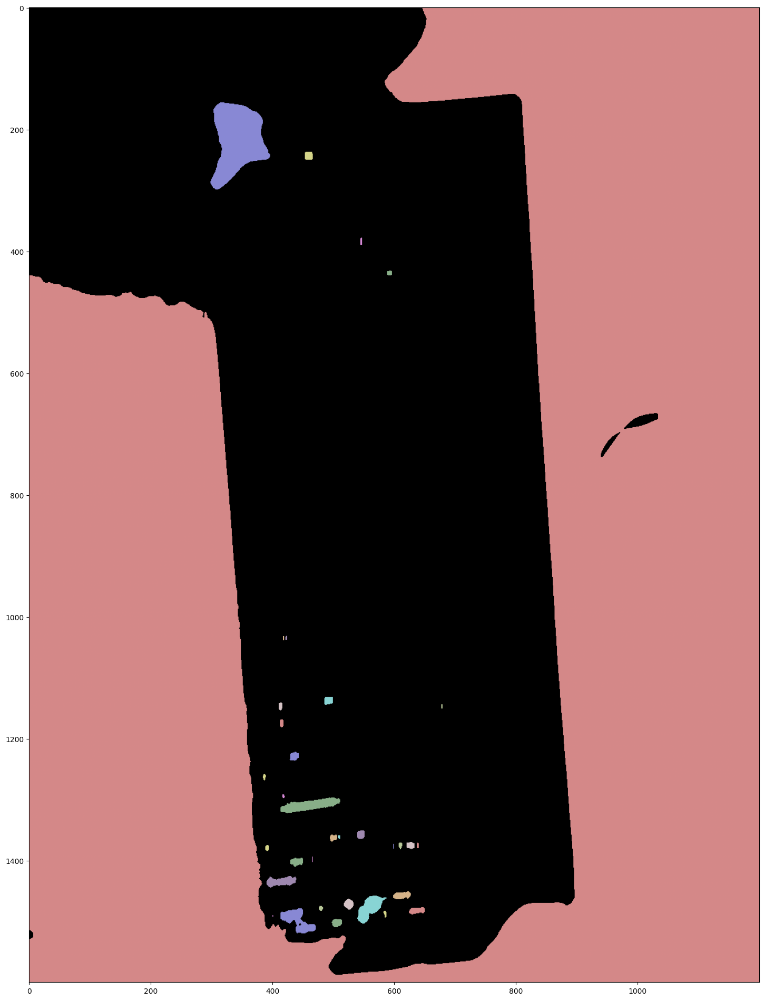

In [214]:
label_image, label_nos = label(median, connectivity =2, return_num=True)
image_label_overlay = label2rgb(label_image, image=median)
fig, ax = plt.subplots(figsize=(40, 24))
ax.imshow(image_label_overlay)
plt.show()

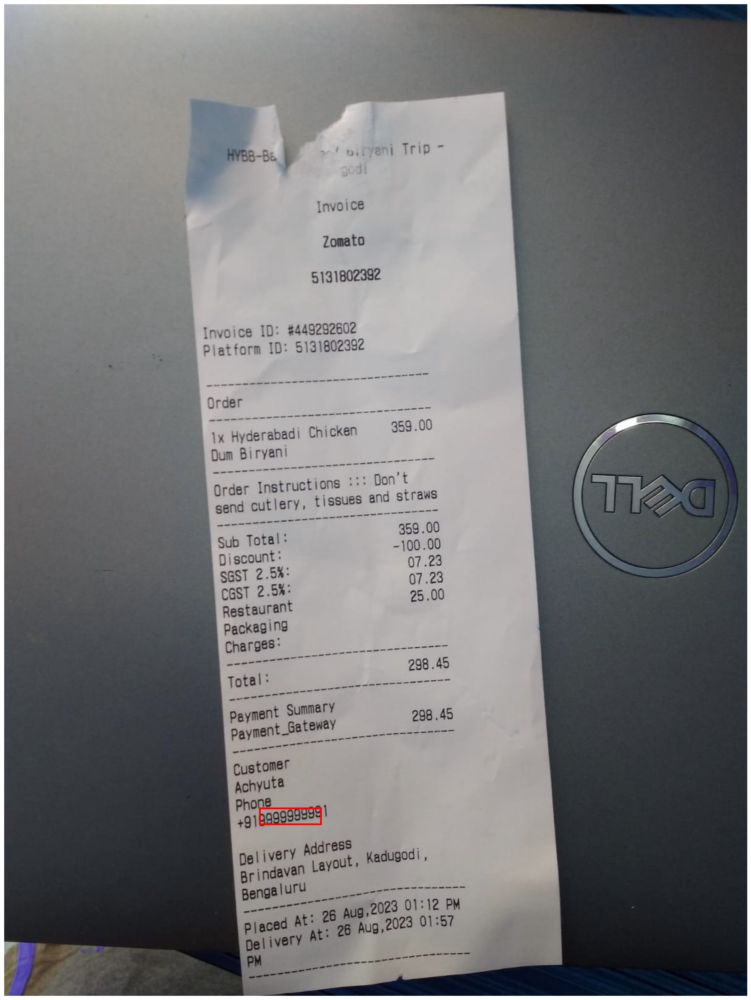

In [217]:
regiond = {region.bbox:int(region.area) for region in regionprops(label_image)}
bigger = sorted(regiond,key=regiond.get, reverse=True)[2]
minr, minc, maxr, maxc = bigger
rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr, fill=False, edgecolor='red', linewidth=3)
fig, ax = plt.subplots(figsize=(40, 24))
ax.imshow(img)
ax.add_patch(rect)
ax.set_axis_off()
plt.tight_layout()
plt.show()